In [6]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import pickle
from collections import defaultdict
from sklearn.manifold import TSNE

## how does the sampled data point look like? which are sampled, unlabeled, labeled?

In [23]:
def read_embedding_results(cylce):
    features = np.load(f'{base_path}/{folder}_{cycle}_features.npy')
    features_label = np.load(f'{base_path}/{folder}_{cycle}_features_label.npy')
    labeled_indices = np.load(f'{base_path}/{folder}_{cycle}_labeled_indices.npy')

    return [features, features_label, labeled_indices]

dataset = 'SnapshotSerengetiSmall'
method = 'mobyv2al'
run_id = 20240623
base_path = f'/Volumes/data01/waitsun/result_data_analysis/{dataset}_{method}_{run_id}'
folder = f'{dataset}_{method}_{run_id}'
features, features_label, labeled_indices = [],[],[]

for cycle in range(10):
    results = read_embedding_results(cycle)
    features.append(results[0])
    features_label.append(results[1])
    labeled_indices.append(results[2])





In [ ]:
tsne_embeddings = []
for i in range(10):
    tsne = TSNE(n_components=2, random_state=1234,n_jobs=-1)
    tmp = tsne.fit_transform(features[i])
    tsne_embeddings.append(tmp)

In [34]:
import pickle

# with open('tsne_embeddings_coreset.pkl', 'wb') as file:
#     pickle.dump(tsne_embeddings, file)

with open('tsne_embeddings_coreset.pkl','rb') as file:
    tsne_embeddings = pickle.load(file)

In [7]:
import random
NUM_TRAIN = 512522
indices = list(range(NUM_TRAIN))
random.seed(1234)
random.shuffle(indices)

In [35]:
sampled_indices = []
sampled_indices_position = []
for i in range(0,10,1):
    if i <=0:
        tmp = [(li, index) for  index,li in enumerate(labeled_indices[i]) if li not in indices[:5000]]
        tmp,pos = zip(*tmp)
    else:    
        tmp = [(li,index) for  index,li in enumerate(labeled_indices[i]) if li not in labeled_indices[i-1]]
        tmp,pos = zip(*tmp)
    sampled_indices.append(tmp)
    sampled_indices_position.append(pos)



In [9]:
sampled_labels = []
for i in range(10):
    tmp = [features_label[i][index] for index in sampled_indices_position[i]]
    sampled_labels.append(tmp)

    

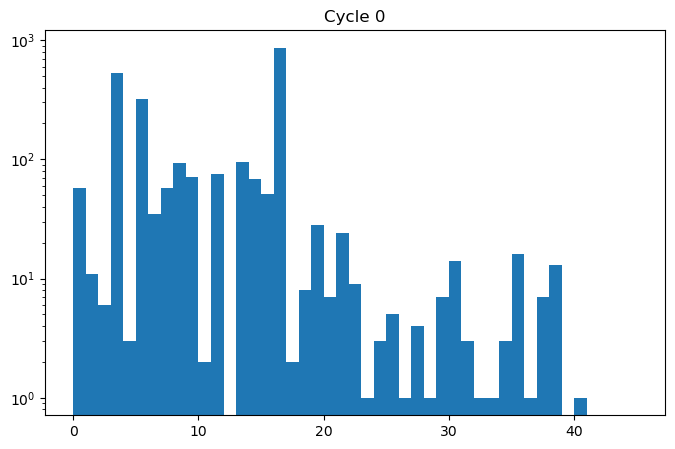

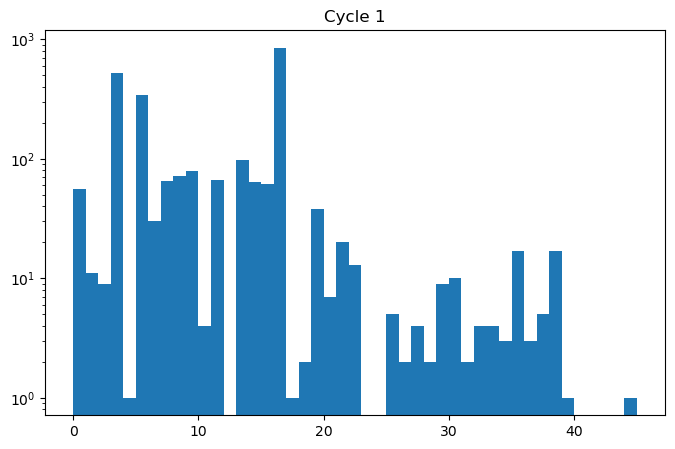

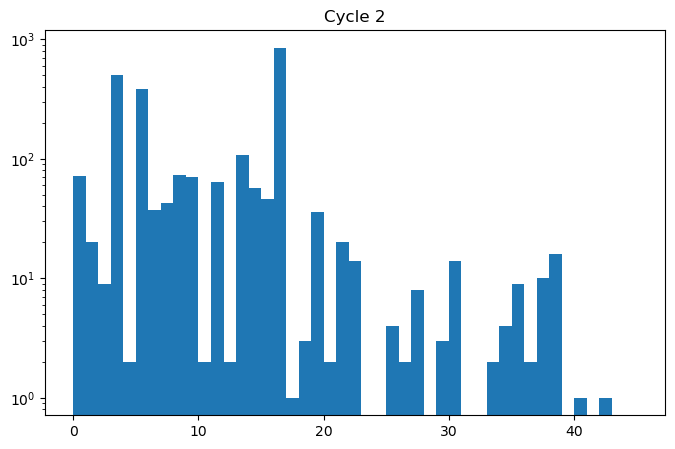

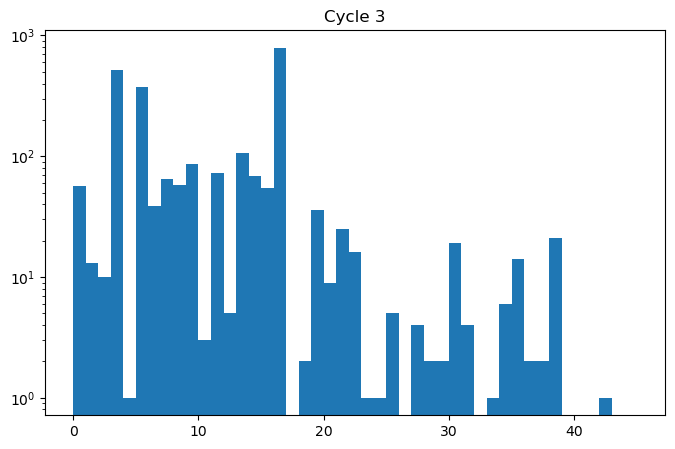

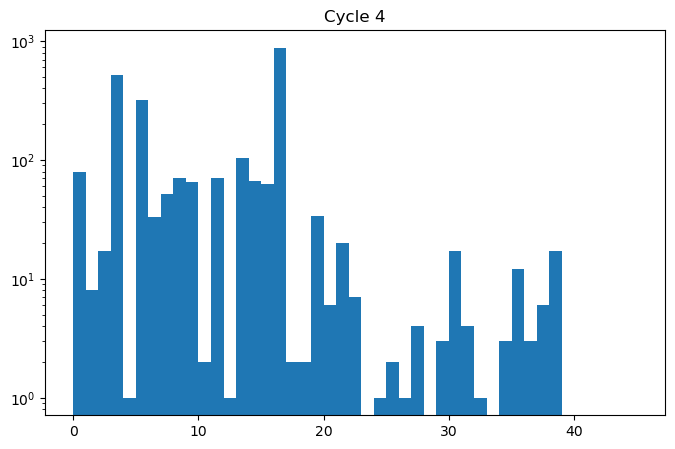

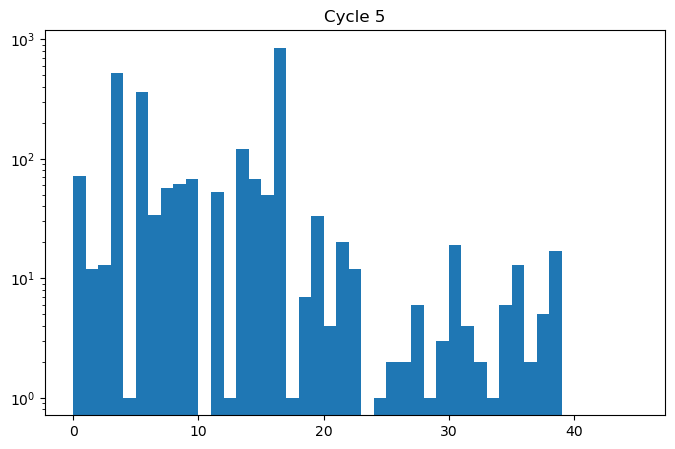

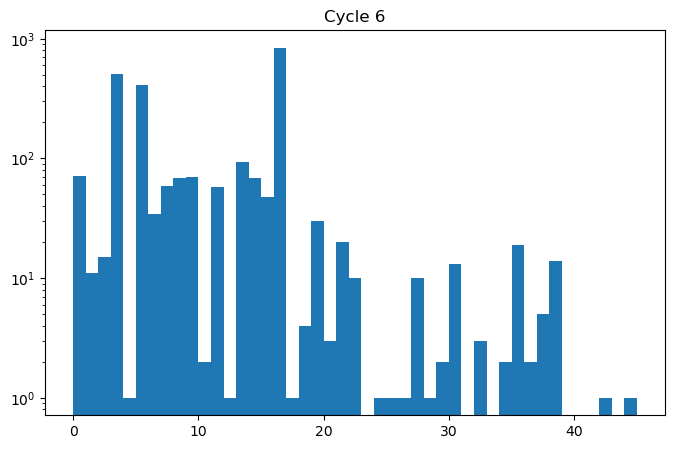

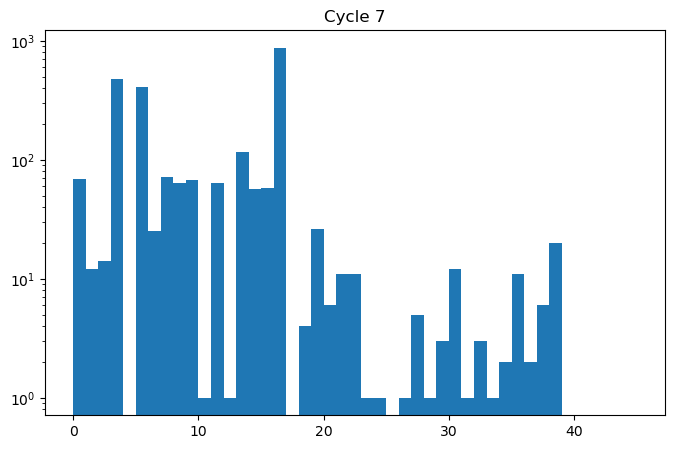

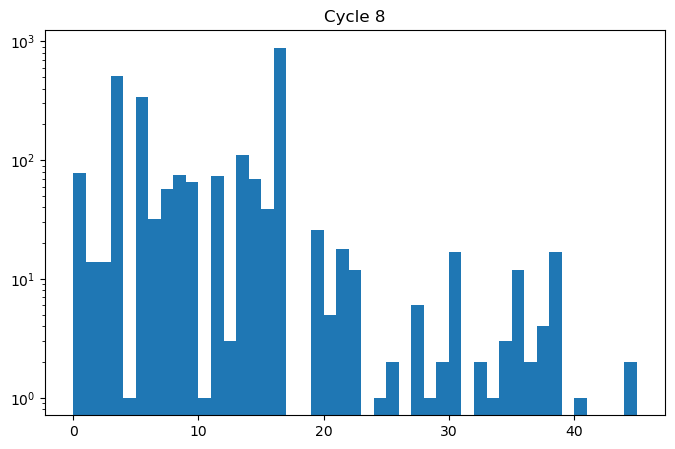

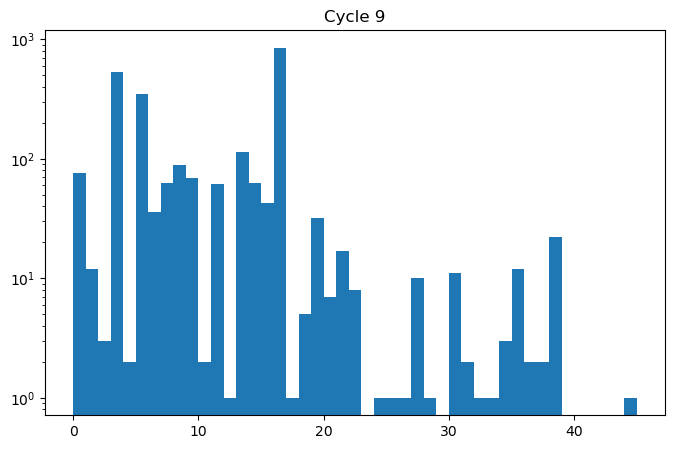

In [10]:
for i in range(10):
    fig, ax = plt.subplots(figsize=(8,5))
    ax.hist(sampled_labels[i],bins=np.arange(0,46,1))
    ax.set_yscale('log')
    ax.set_title(f'Cycle {i}')

In [14]:
lut = pd.read_pickle('/Volumes/data01/waitsun/snapshotSerengetiCropedResized/df_category_lut_adapted.df')

/var/folders/5f/83w09gxd6pq0h169x9168wcw0000gn/T/ipykernel_1208/3059673365.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(species_name,rotation=90)


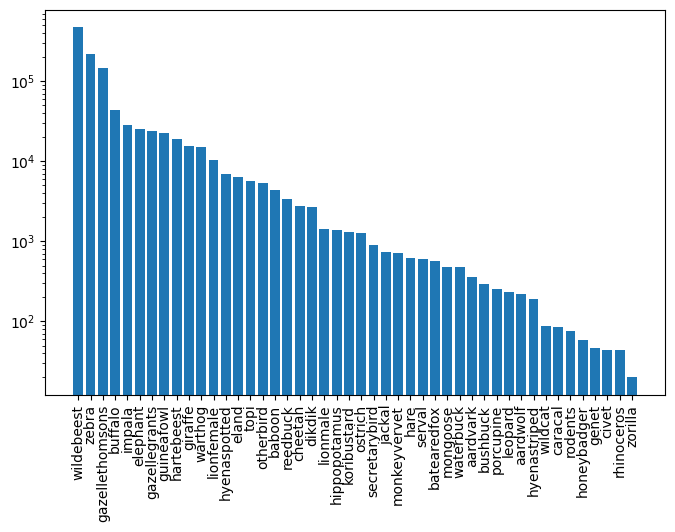

/var/folders/5f/83w09gxd6pq0h169x9168wcw0000gn/T/ipykernel_1208/3059673365.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(species_name,rotation=90)


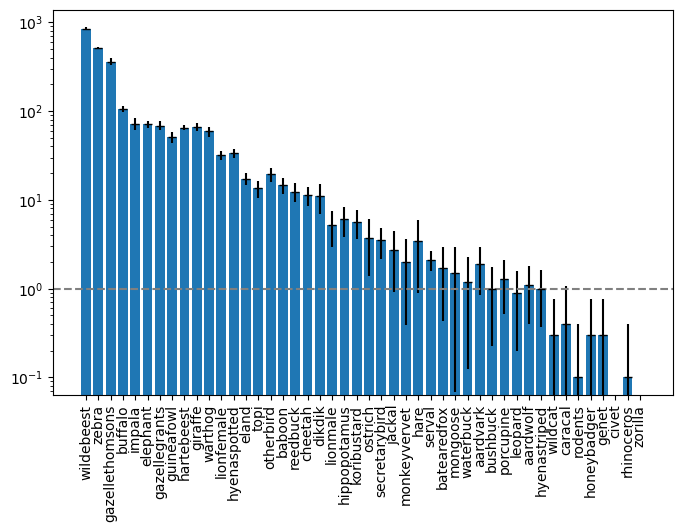

In [18]:
df_test = pd.read_pickle('/Volumes/data01/waitsun/snapshotSerengetiCropedResized/df_metadata_test.df')
df_train = pd.read_pickle('/Volumes/data01/waitsun/snapshotSerengetiCropedResized/df_metadata_train.df')

category, num = zip(*list(df_train['category_id'].value_counts().items()))

category = np.array(category)
num = np.array(num)

sorted_a = np.argsort(category)
species_name = [lut.name[i] for i in category]
fig, ax = plt.subplots(figsize=(8,5))
ax.bar(species_name,num,log=True)
ax.set_xticklabels(species_name,rotation=90)
plt.show()

counts_mean = np.zeros((10,46))
for i in range(10):
    unique_values, counts = np.unique(sampled_labels[i],return_counts=True)
    for j in range(len(unique_values)):
        counts_mean[i,unique_values[j]] = counts[j]

counts_std = counts_mean.std(axis=0)
counts_mean = counts_mean.mean(axis=0)

fig, ax = plt.subplots(figsize=(8,5))
ax.bar(species_name,counts_mean[category],log=True)
ax.errorbar(species_name,counts_mean[category],yerr=counts_std[category],fmt='_',color='black')
ax.set_xticklabels(species_name,rotation=90)
ax.axhline(y=1, color='grey', linestyle='--')
plt.show()

In [19]:
np.save('counts_mean_coreset.npy',counts_mean)
np.save('counts_std_coreset.npy',counts_std)

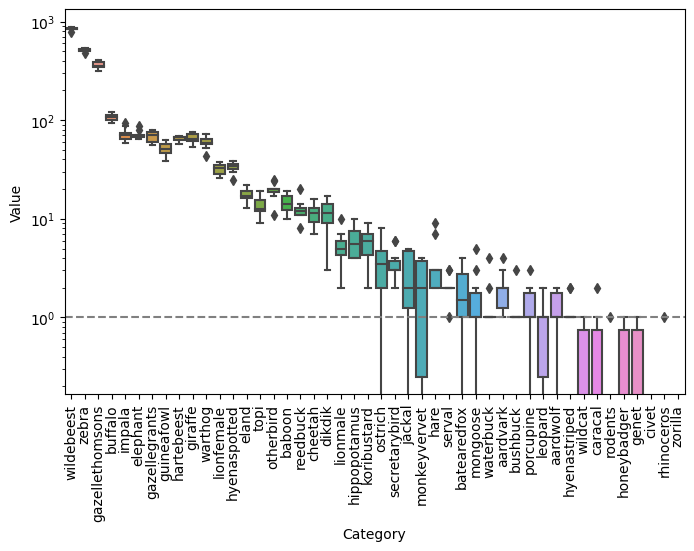

In [28]:
import seaborn as sns

bbox = {
    'Category': [],
    'Value': []
}

for i in range(len(sampled_labels)):
    unique_values, counts = np.unique(sampled_labels[i],return_counts=True)
    for cat_id, count in zip(unique_values,counts):
        bbox['Category'].append(cat_id)
        bbox['Value'].append(count)

    for i in range(46):
        if i not in unique_values:
            bbox['Category'].append(i)
            bbox['Value'].append(0)

df = pd.DataFrame(bbox)
df['Category'] = pd.Categorical(df['Category'], categories=category.tolist(), ordered=False)
df = df.sort_values('Category')
fig, ax = plt.subplots(figsize=(8,5))
sns.boxplot(data= df, x='Category', y='Value',ax=ax)
# ax.errorbar(species_name,counts_mean[category],yerr=counts_std[category],fmt='_',color='black')
ax.set_xticklabels(species_name,rotation=90)
ax.axhline(y=1, color='grey', linestyle='--')
# ax.set_ylim(0,10)
ax.set_yscale('log')
plt.show()

In [29]:
pd.to_pickle(df,'boxplot_coreset.df')

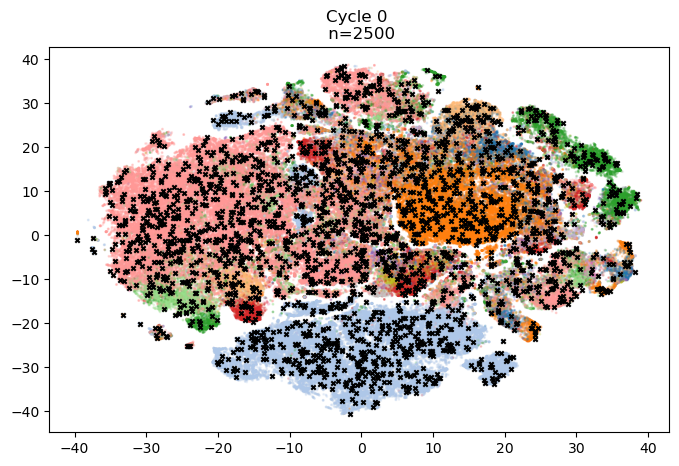

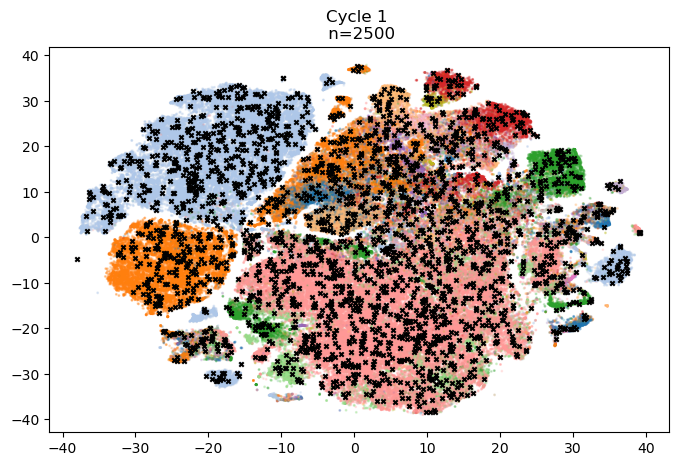

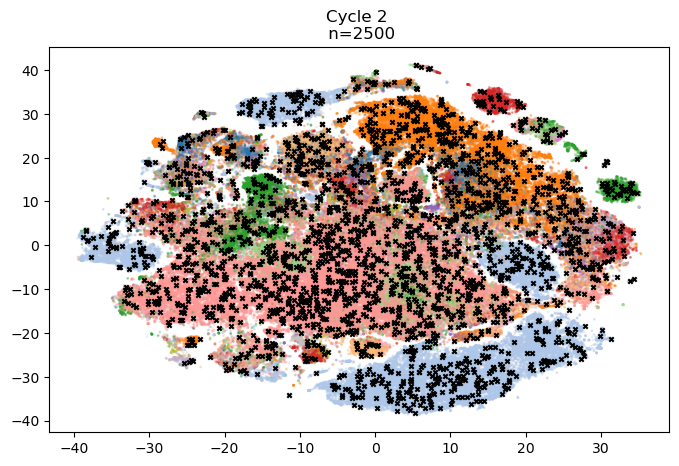

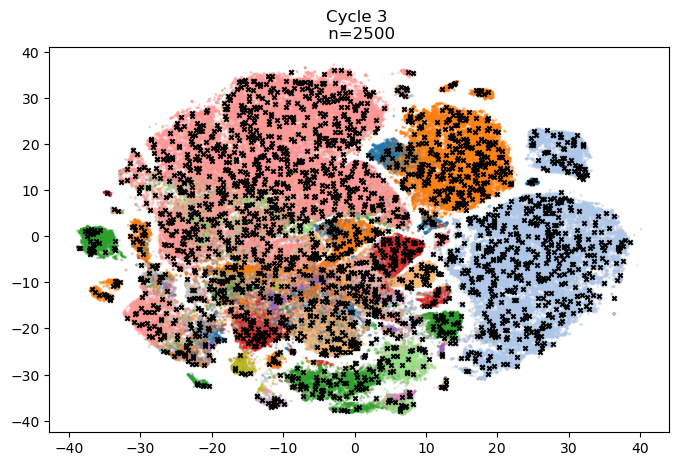

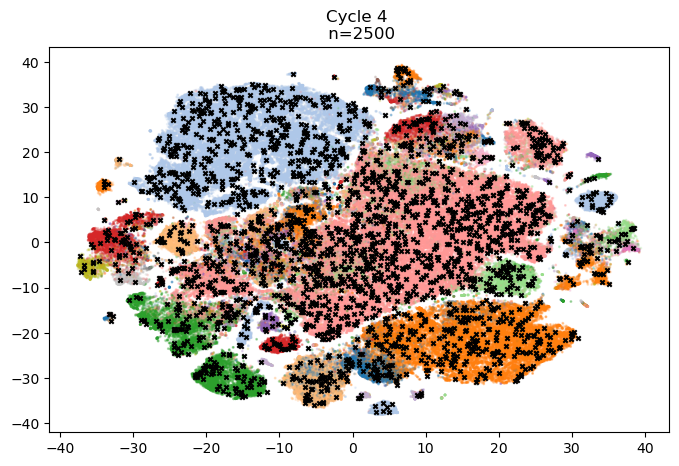

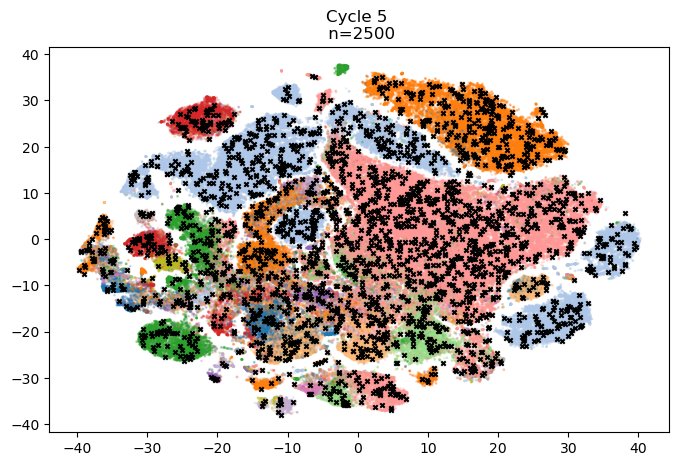

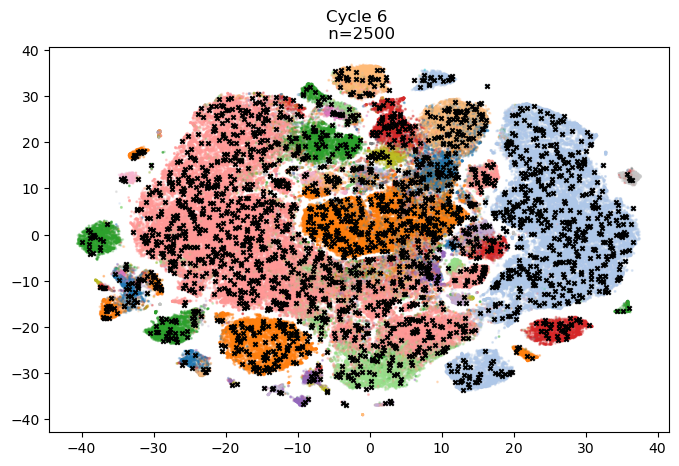

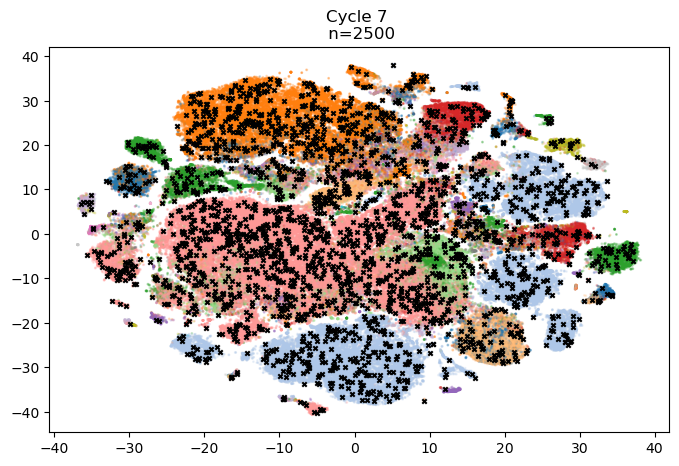

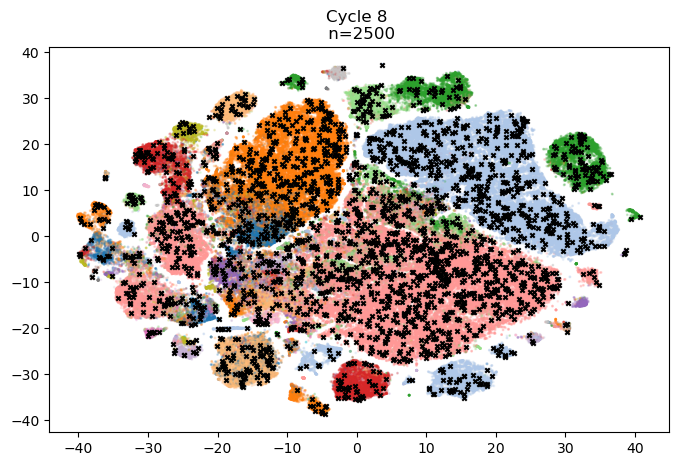

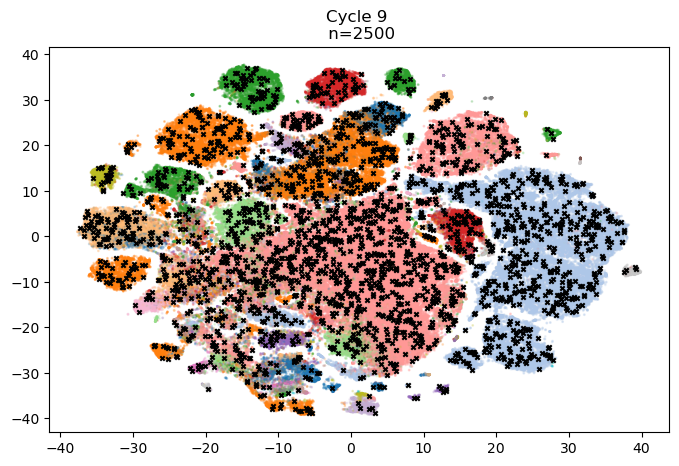

In [12]:
for i in range(10):
    fig, ax = plt.subplots(figsize=(8,5))
    ax.scatter(tsne_embeddings[i][:,0],tsne_embeddings[i][:,1],c=features_label[i],s=1,cmap='tab20',alpha=0.2)
    ax.scatter(tsne_embeddings[i][sampled_indices_position[i],0],tsne_embeddings[i][sampled_indices_position[i],1],c='black',s=10,marker='x')
    ax.set_title(f'Cycle {i} \n n={len(tsne_embeddings[i][sampled_indices_position[i],0])}')
               

In [37]:
tsne_embeddings
cylce = 9
colors = plt.get_cmap('tab20').colors
markers = ['+','x','v']
min_lim = np.min(tsne_embeddings[cycle])
max_lim = np.max(tsne_embeddings[cycle])
fig, axes = plt.subplots(6,8,figsize=(50, 50),dpi=300)
for i,ax in enumerate(axes.flatten()):
    if i >=46:
        continue
    positions = np.where(features_label[cycle]== i)
    np.where(features_label[cycle].any() in sampled_indices_position[cycle])
    # if len(positions[0]) > 50:
    #     positions = positions[0][:50]
    # else:
    #     positions = positions[0]
    tsne_embeddings_i = tsne_embeddings[cycle][positions]
    sampled_tsne_embeddings_i = [pos for pos in positions[0] if pos in sampled_indices_position[cycle]]

    ax.scatter(tsne_embeddings_i[:,0], tsne_embeddings_i[:,1], cmap=colors[i%20] ,s=30, marker=markers[i//20])
    ax.scatter(tsne_embeddings[cycle][sampled_tsne_embeddings_i,0], tsne_embeddings[cycle][sampled_tsne_embeddings_i,1], c='black',s=30, marker='x')
    ax.set_title(f'Class {lut.name[i]}')
    ax.set_xlim(min_lim, max_lim)
    ax.set_ylim(min_lim, max_lim)

fig.suptitle(f'Coreset',fontsize=40)
plt.savefig(f'plots/Embedding_coreset.png')
plt.show()

/var/folders/5f/83w09gxd6pq0h169x9168wcw0000gn/T/ipykernel_1208/2342227172.py:20: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(tsne_embeddings_i[:,0], tsne_embeddings_i[:,1], cmap=colors[i%20] ,s=30, marker=markers[i//20])


/var/folders/5f/83w09gxd6pq0h169x9168wcw0000gn/T/ipykernel_1208/1132539159.py:17: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(tsne_embeddings_i[:,0], tsne_embeddings_i[:,1], cmap=colors[i%20] ,s=30, marker=markers[i//20])


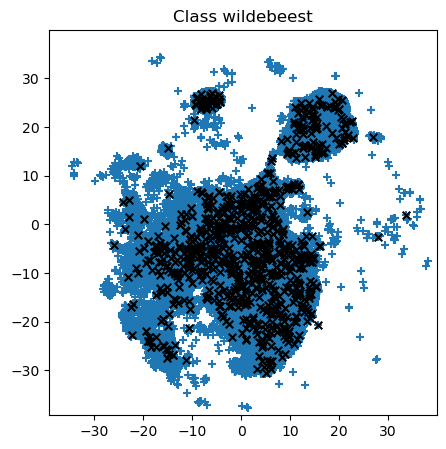

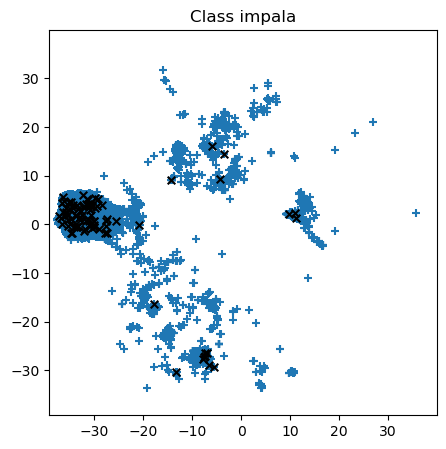

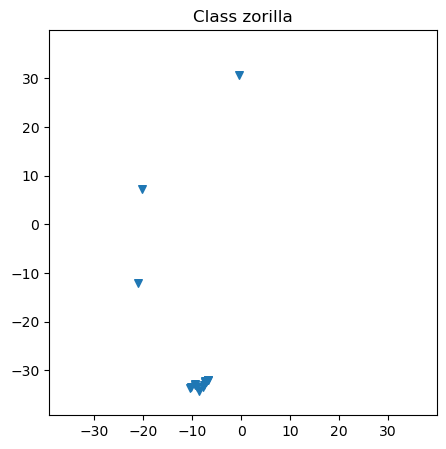

In [45]:
cylce = 9
colors = plt.get_cmap('tab20').colors
markers = ['+','x','v']
min_lim = np.min(tsne_embeddings[cycle])
max_lim = np.max(tsne_embeddings[cycle])
for i in [16,8,43]:
    fig, ax = plt.subplots(figsize=(5, 5))
    positions = np.where(features_label[cycle]== i)
    np.where(features_label[cycle].any() in sampled_indices_position[cycle])
    # if len(positions[0]) > 50:
    #     positions = positions[0][:50]
    # else:
    #     positions = positions[0]
    tsne_embeddings_i = tsne_embeddings[cycle][positions]
    sampled_tsne_embeddings_i = [pos for pos in positions[0] if pos in sampled_indices_position[cycle]]

    ax.scatter(tsne_embeddings_i[:,0], tsne_embeddings_i[:,1], cmap=colors[i%20] ,s=30, marker=markers[i//20])
    ax.scatter(tsne_embeddings[cycle][sampled_tsne_embeddings_i,0], tsne_embeddings[cycle][sampled_tsne_embeddings_i,1], c='black',s=30, marker='x')
    ax.set_title(f'Class {lut.name[i]}')
    ax.set_xlim(min_lim, max_lim)
    ax.set_ylim(min_lim, max_lim)
    plt.savefig(f'plots/Embedding_coreset_{lut.name[i]}.png')

In [ ]:
train_df = pd.read_pickle(f'/Volumes/data01/waitsun/snapshotSerengetiCropedResized/df_metadata_train.df')



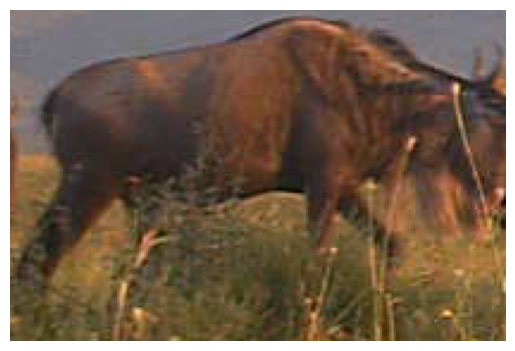

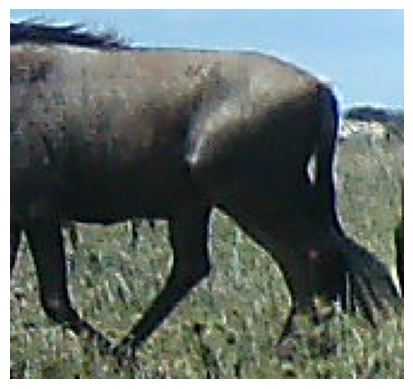

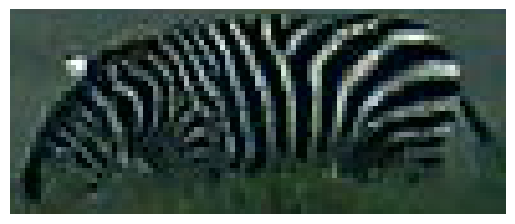

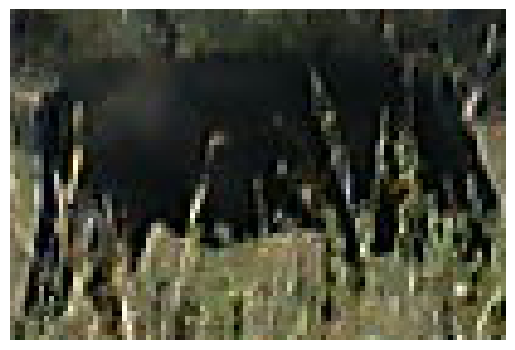

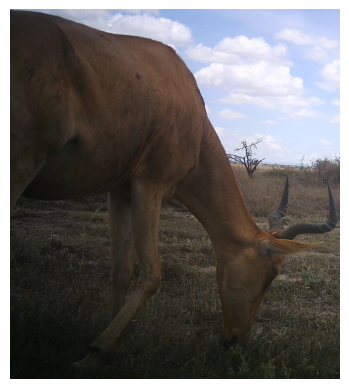

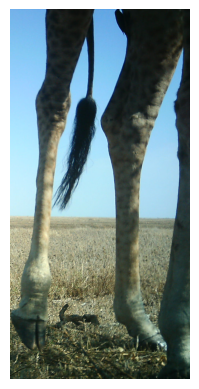

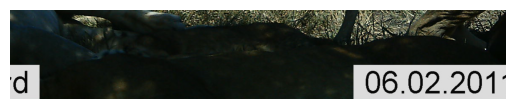

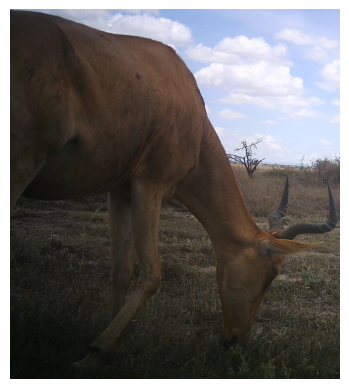

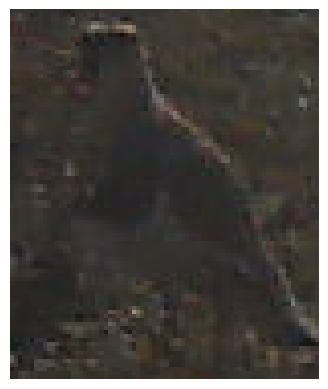

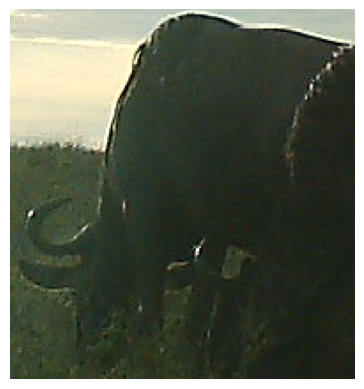

In [29]:
import PIL.Image as Image
import os 
import torchvision.transforms as T
root_dir = '/Volumes/data01/waitsun/snapshotSerengeti'
picks = np.random.choice(labeled_indices[0],10)
for num,idx in enumerate(picks):
    img_name = os.path.join(root_dir,train_df.iloc[idx, 0]+'.JPG')

    image = Image.open(img_name)
    #image = Image.new('RGB',(128, 128))
    #image = pyvips.Image.new_from_file(img_name, access='sequential')
    bbox_im = train_df.iloc[idx, 1]
    image_croped = T.functional.crop(
        image, int(bbox_im[1]), int(bbox_im[0]), int(bbox_im[3]), int(bbox_im[2])) # top, left, height, width

    plt.imshow(image_croped)
    plt.axis('off')
    plt.savefig(f'plots/Embedding_coreset_samples_{num}.png')
    plt.show()

# coreset with 222 epochs embeddings

In [21]:
dataset = 'SnapshotSerengetiSmall'
method = 'mobyv2al'
run_id = 20240726
base_path = f'/Volumes/data01/waitsun/result_data_analysis/{dataset}_{method}_{run_id}'
folder = f'{dataset}_{method}_{run_id}'
features, features_label, labeled_indices = [],[],[]

for cycle in range(10):
    results = read_embedding_results(cycle)
    features.append(results[0])
    features_label.append(results[1])
    labeled_indices.append(results[2])
labeled_indices_2 = labeled_indices

In [ ]:
tsne_embeddings = []
for i in range(10):
    tsne = TSNE(n_components=2, random_state=1234,n_jobs=-1)
    tmp = tsne.fit_transform(features[i])
    tsne_embeddings.append(tmp)

In [46]:
import pickle

with open('tsne_embeddings_coreset_222e.pkl', 'wb') as file:
    pickle.dump(tsne_embeddings, file)


In [47]:
cylce = 9
colors = plt.get_cmap('tab20').colors
markers = ['+','x','v']
min_lim = np.min(tsne_embeddings[cycle])
max_lim = np.max(tsne_embeddings[cycle])
fig, axes = plt.subplots(6,8,figsize=(50, 50),dpi=300)
for i,ax in enumerate(axes.flatten()):
    if i >=46:
        continue
    positions = np.where(features_label[cycle]== i)
    np.where(features_label[cycle].any() in sampled_indices_position[cycle])
    # if len(positions[0]) > 50:
    #     positions = positions[0][:50]
    # else:
    #     positions = positions[0]
    tsne_embeddings_i = tsne_embeddings[cycle][positions]
    sampled_tsne_embeddings_i = [pos for pos in positions[0] if pos in sampled_indices_position[cycle]]

    ax.scatter(tsne_embeddings_i[:,0], tsne_embeddings_i[:,1], cmap=colors[i%20] ,s=30, marker=markers[i//20])
    ax.scatter(tsne_embeddings[cycle][sampled_tsne_embeddings_i,0], tsne_embeddings[cycle][sampled_tsne_embeddings_i,1], c='black',s=30, marker='x')
    ax.set_title(f'Class {lut.name[i]}')
    ax.set_xlim(min_lim, max_lim)
    ax.set_ylim(min_lim, max_lim)

fig.suptitle(f'Coreset 222e',fontsize=40)
plt.savefig(f'plots/Embedding_coreset_222e.png')
plt.show()

/var/folders/5f/83w09gxd6pq0h169x9168wcw0000gn/T/ipykernel_1208/2776635264.py:19: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(tsne_embeddings_i[:,0], tsne_embeddings_i[:,1], cmap=colors[i%20] ,s=30, marker=markers[i//20])


In [ ]:
cylce = 9
colors = plt.get_cmap('tab20').colors
markers = ['+','x','v']
min_lim = np.min(tsne_embeddings[cycle])
max_lim = np.max(tsne_embeddings[cycle])
for i in [16,8,43]:
    fig, ax = plt.subplots(figsize=(5, 5))
    positions = np.where(features_label[cycle]== i)
    np.where(features_label[cycle].any() in sampled_indices_position[cycle])
    # if len(positions[0]) > 50:
    #     positions = positions[0][:50]
    # else:
    #     positions = positions[0]
    tsne_embeddings_i = tsne_embeddings[cycle][positions]
    sampled_tsne_embeddings_i = [pos for pos in positions[0] if pos in sampled_indices_position[cycle]]

    ax.scatter(tsne_embeddings_i[:,0], tsne_embeddings_i[:,1], cmap=colors[i%20] ,s=30, marker=markers[i//20])
    ax.scatter(tsne_embeddings[cycle][sampled_tsne_embeddings_i,0], tsne_embeddings[cycle][sampled_tsne_embeddings_i,1], c='black',s=30, marker='x')
    ax.set_title(f'Class {lut.name[i]}')
    ax.set_xlim(min_lim, max_lim)
    ax.set_ylim(min_lim, max_lim)
    plt.savefig(f'plots/Embedding_coreset_222e{lut.name[i]}.png')

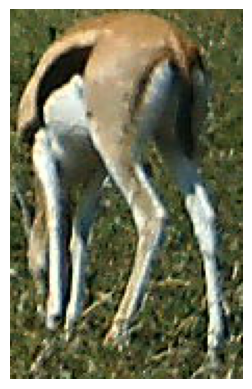

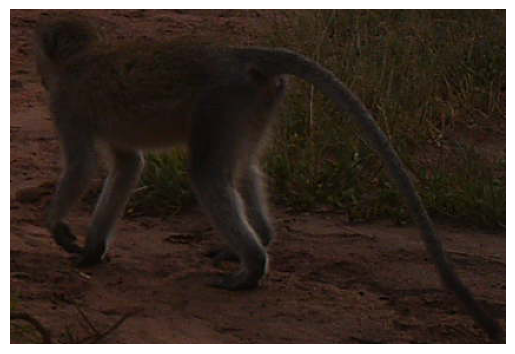

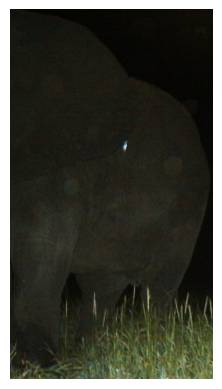

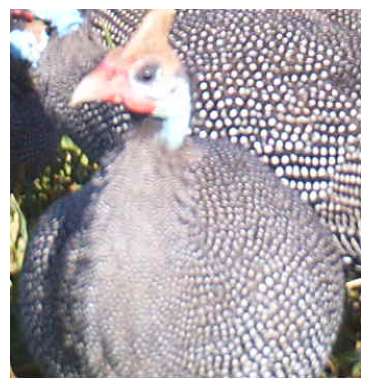

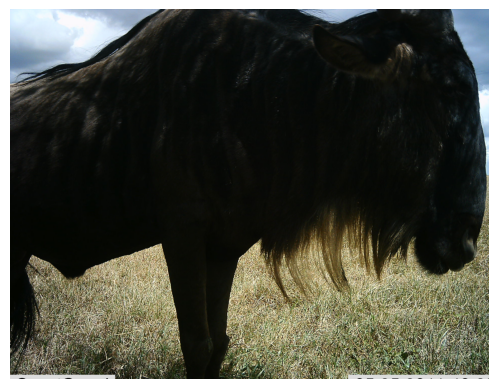

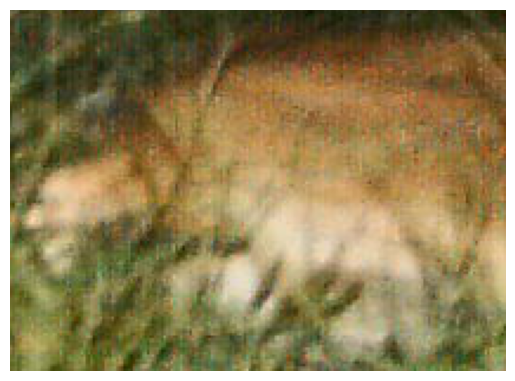

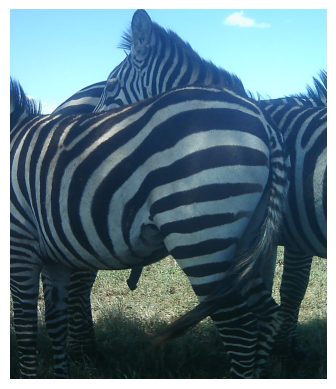

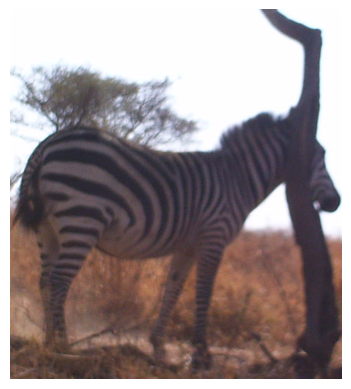

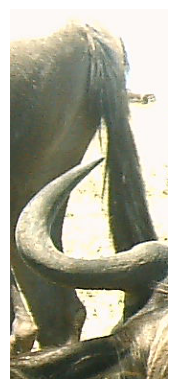

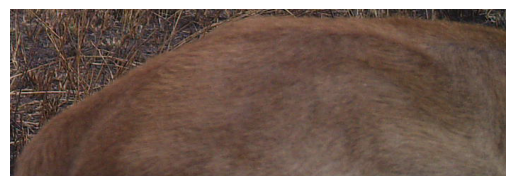

In [31]:
import PIL.Image as Image
import os 
import torchvision.transforms as T
root_dir = '/Volumes/data01/waitsun/snapshotSerengeti'
picks = np.random.choice(labeled_indices_2[0],10)
for num, idx in enumerate(picks):
    img_name = os.path.join(root_dir,train_df.iloc[idx, 0]+'.JPG')

    image = Image.open(img_name)
    #image = Image.new('RGB',(128, 128))
    #image = pyvips.Image.new_from_file(img_name, access='sequential')
    bbox_im = train_df.iloc[idx, 1]
    image_croped = T.functional.crop(
        image, int(bbox_im[1]), int(bbox_im[0]), int(bbox_im[3]), int(bbox_im[2])) # top, left, height, width

    plt.imshow(image_croped)
    plt.axis('off')
    plt.savefig(f'plots/Embedding_coreset_222e_samples_{num}.png',bbox_inches='tight')
    plt.show()